<center>
<h1>Week 5 Mini-Project: Gans</h1>
<h3> Author: Wenhao Chen<h3>
<h3>Kaggle: <a href="https://www.kaggle.com/competitions/gan-getting-started/data">I’m Something of a Painter Myself</a></h3>
</center>


<h3>1. Introduction</h3>

<h5> Background and Motivation</h5>

In recent years, the field of Computer Vision has evolved beyond simple recognition tasks, such as classification and detection, into the realm of creation. Generative Artificial Intelligence, particularly through the use of Generative Adversarial Networks (GANs), has enabled machines to synthesize highly realistic images. A specific subset of this field is Style Transfer, where the artistic aesthetic of one image is applied to the content of another.

Early approaches to style transfer, such as those by Gatys et al. (2015), relied on optimization techniques that were computationally expensive and slow. The advent of GANs allowed for faster, feed forward stylization. However, traditional GANs typically require paired training data (e.g., a dataset containing a black and white photo and its exact colored counterpart) to learn the translation mapping. Collecting such paired data for artistic styles is often impossible; we cannot obtain a photograph of a scene exactly as Claude Monet saw it in the 19th century.

<h5> Problem Statement: Unpaired Image to Image Translation</h5>

The core technical challenge addressed in this project is Unpaired Image-to-Image Translation. Unlike supervised learning tasks where a ground truth y exists for every input x, we possess two distinct image domains with no direct correspondence:

Domain X: A collection of realistic landscape photographs.

Domain Y: A collection of impressionist paintings by Claude Monet.

The objective is to learn a mapping function G:X→Y such that the distribution of generated images G(X) is indistinguishable from the true distribution of Monet paintings Y, while preserving the semantic content (buildings, trees, rivers) of the original photographs.

<h5>Dataset Overview</h5>

This project utilizes the dataset provided by the Kaggle competition "I'm Something of a Painter Myself." The dataset highlights the extreme imbalance and lack of pairing inherent in artistic style transfer:

Source Domain (Photos): Approximately 7,000 realistic photographs of nature and landscapes.

Target Domain (Monet): Only 300 digital images of paintings by Claude Monet.

This scarcity of target data (300 images) presents a significant risk of overfitting, where a standard model might simply memorize the paintings rather than learning the stylistic abstraction.

<h5>Methodology: Cycle Consistent Adversarial Networks (CycleGAN)</h5>

To address the lack of paired data, this assignment implements a CycleGAN architecture (Zhu et al., 2017). CycleGAN overcomes the unpaired constraint by introducing a Cycle Consistency Loss.

The architecture operates on the intuition that image translation should be cycle consistent: if we translate a photo to a painting, and then translate that painting back to a photo, we should arrive at the original image. Mathematically, this enforces:

$$F(G(x))\approx x$$

where G maps Photo → Monet and F maps Monet → Photo. This constraint forces the model to decouple "style" from "content," ensuring that while the texture changes to resemble an oil painting, the structural reality of the original photograph remains intact.

In [1]:
import os
import glob
import math
import time
import zipfile
from tqdm import tqdm
from PIL import Image
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import itertools
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras import layers, Model
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from scipy.linalg import sqrtm

In [ ]:
    #from google.colab import drive
    #drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

<h3>2. EDA</h3>

The dataset is sourced from the gan-getting-started directory. While the data is provided in both TFRecord and JPEG formats, this project utilizes the raw JPEG image directories. The dataset is divided into two distinct domains:

Target Domain (Monet): Contains 300 artistic images of paintings.

Source Domain (Photo): Contains 7,038 realistic nature photographs.

A significant class imbalance is observed, with the source photos outnumbering the target paintings by a factor of approximately 23:1. All images in the dataset are uniformly dimensioned at 256×256 pixels with 3 color channels (RGB). This consistency eliminates the need for initial image resizing or cropping, allowing us to feed the data directly into the model unless a different input resolution is architecture dependent.


In [3]:
path = "gan-getting-started"#"/content/drive/MyDrive/gan-getting-started"#
photopath = f"{path}/photo_"
monetpath = f"{path}/monet_"

photo_dir = f"{photopath}jpg"
monet_dir = f"{monetpath}jpg"

IMG_SIZE = 256
#reshape_size = 128
BATCH_SIZE = 1
AUTOTUNE = tf.data.AUTOTUNE


In [56]:
def get_random_image(folder_path):
    #files = random.choice(os.listdir(folder_path))
    selected_file = random.choice(os.listdir(folder_path))
    return os.path.join(folder_path, selected_file) 

def imgfolderinfo(photo_dir):
    sizes = []
    formats = []

    img_paths = []
    for img_name in os.listdir(photo_dir):
        if img_name.endswith((".jpg")):#, ".jpeg", ".png"
            img_path = os.path.join(photo_dir, img_name)
            img_paths.append(img_path)
            img = Image.open(img_path)
            sizes.append(img.size)
            formats.append(img.format)

    sizes = np.array(sizes)

    print("Total images:", len(sizes))
    print("Mean size:", sizes.mean(axis=0))
    print("Min size:", sizes.min(axis=0))
    print("Max size:", sizes.max(axis=0))
    return img_paths, sizes


img_paths, sizes = imgfolderinfo(photo_dir)



Total images: 7038
Mean size: [256. 256.]
Min size: [256 256]
Max size: [256 256]


In [30]:
monet_paths, monetsizes = imgfolderinfo(monet_dir)

Total images: 300
Mean size: [256. 256.]
Min size: [256 256]
Max size: [256 256]


In [34]:
def plotexample(dir):
    files = os.listdir(dir)
    sample = random.sample(files, 16)
    plt.figure(figsize=(12,12))
    for i, name in enumerate(sample):
        img = Image.open(os.path.join(dir, name))
        plt.subplot(4,4,i+1)
        plt.imshow(img)
        plt.axis("off")

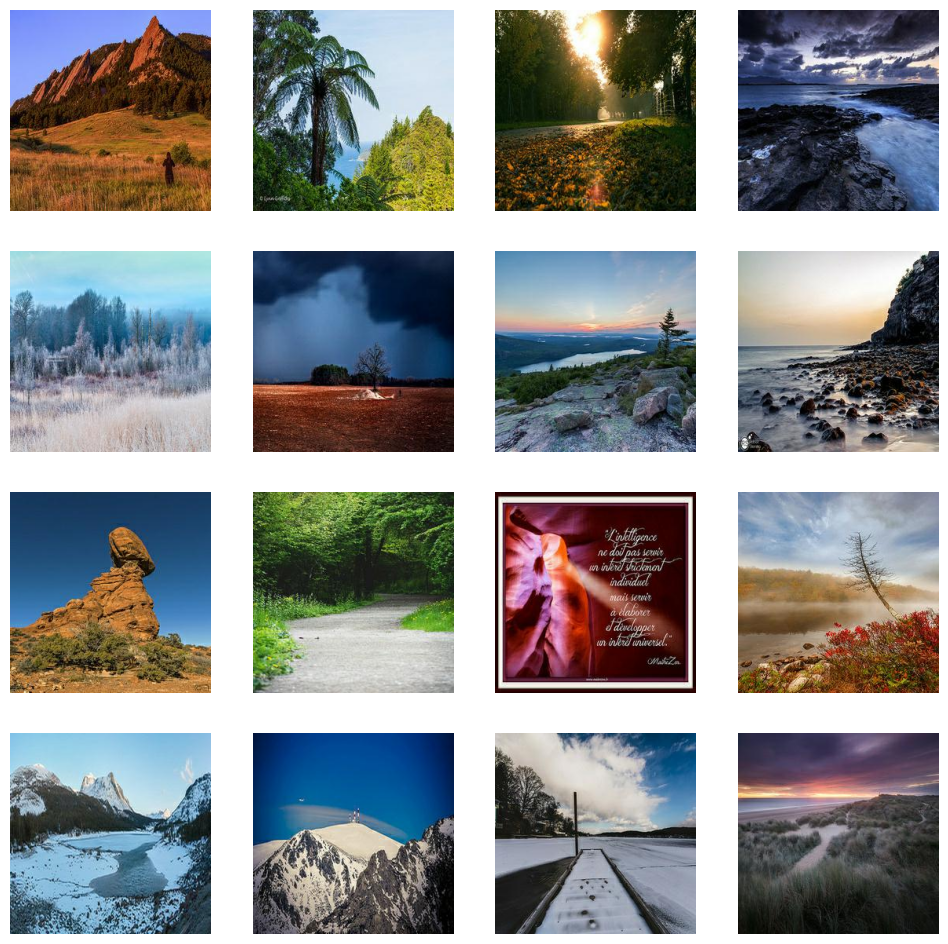

In [32]:
plotexample(photo_dir)

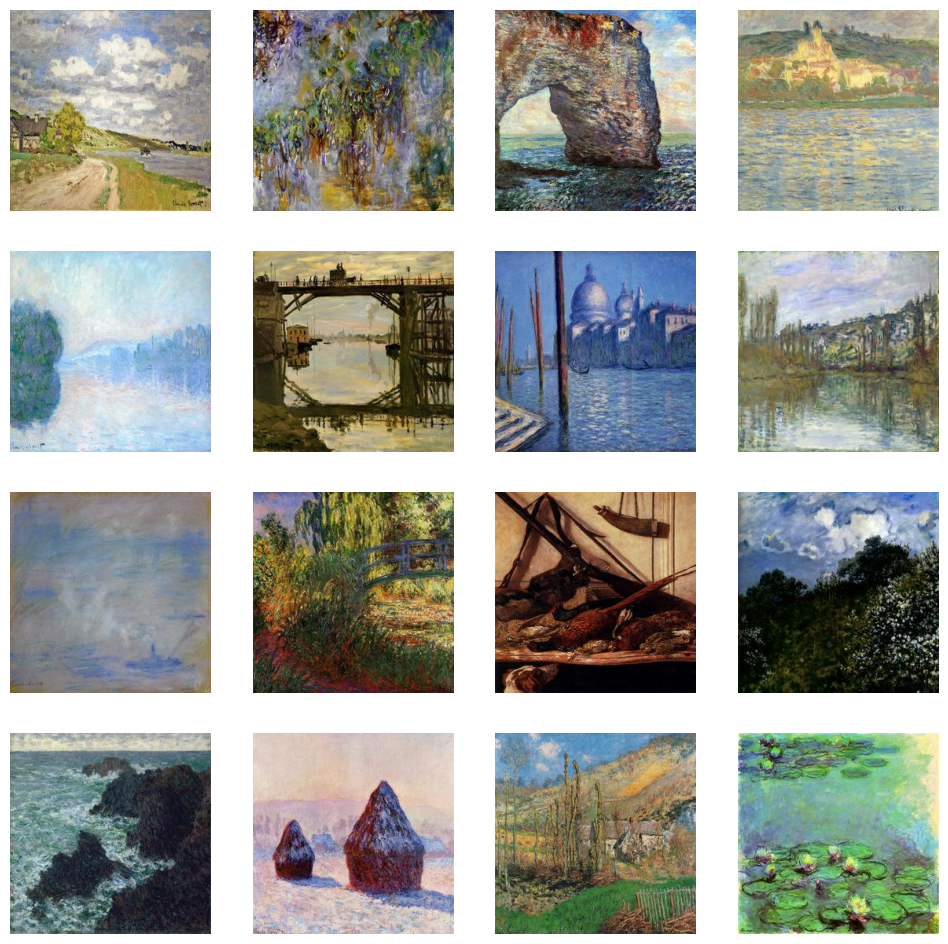

In [35]:
plotexample(monet_dir)

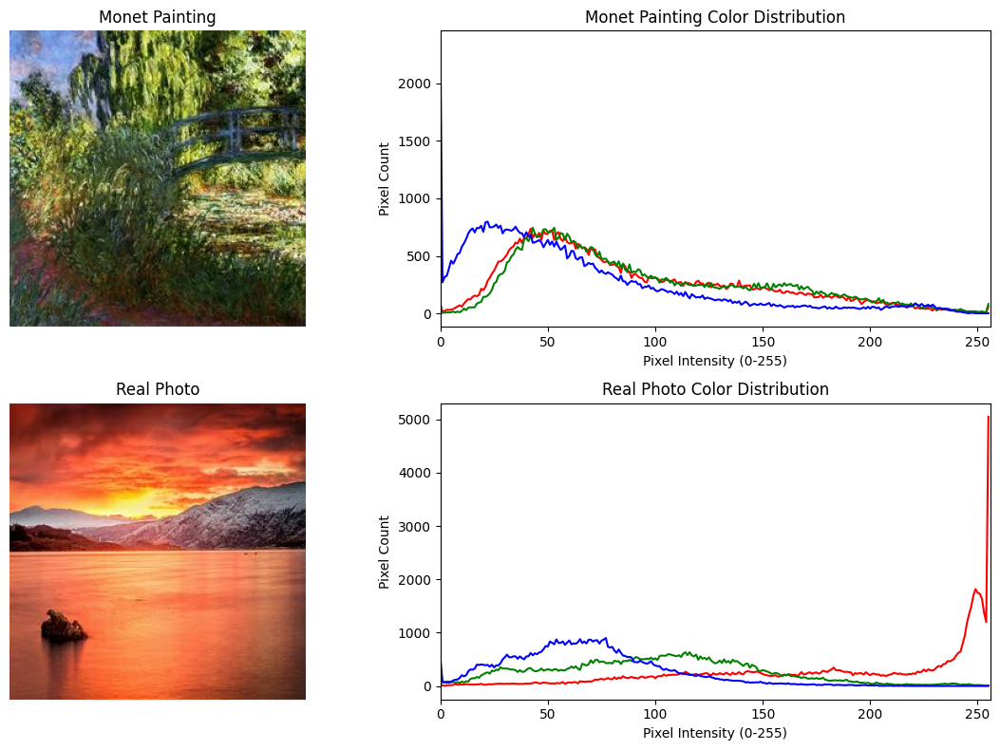

In [57]:
monetsample = get_random_image(monet_dir)
photosample = get_random_image(photo_dir)

img_monet = cv2.cvtColor(cv2.imread(monetsample), cv2.COLOR_BGR2RGB)
img_photo = cv2.cvtColor(cv2.imread(photosample), cv2.COLOR_BGR2RGB)

def plot_histogram(image, title, ax_img, ax_hist):
    # Show the image
    ax_img.imshow(image)
    ax_img.set_title(title)
    ax_img.axis('off')
    
    colors = ('red', 'green', 'blue')
    for i, color in enumerate(colors):
      
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        ax_hist.plot(hist, color=color)
        ax_hist.set_xlim([0, 256])
    ax_hist.set_title(f'{title} Color Distribution')
    ax_hist.set_xlabel('Pixel Intensity (0-255)')
    ax_hist.set_ylabel('Pixel Count')


fig, axes = plt.subplots(2, 2, figsize=(12, 8))


plot_histogram(img_monet, "Monet Painting", axes[0, 0], axes[0, 1])


plot_histogram(img_photo, "Real Photo", axes[1, 0], axes[1, 1])

plt.tight_layout()
plt.show()


The purpose of this visualization is to compare the pixel-level RGB color distributions of a single Monet painting against a representative real photograph. This comparison quantitatively substantiates the stylistic and color-palette differences inherent to each domain, revealing a clear domain shift. Specifically, the Monet sample favors soft, low-intensity color clusters, while the real photo exhibits higher brightness and stronger contrast, often utilizing the full [0, 255] intensity range. This analysis, even at the single image level, highlights the fundamental stylistic gap and demonstrates the necessity for the CycleGAN to learn a non-trivial mapping between these two distinct color spaces during the unpaired image to image translation process.

<h3>Model Implement</h3>

<h5>Model Architecture Description</h5>
The CycleGAN implementation requires four models: two Generators $(G_{X\rightarrow Y}, G_{Y \rightarrow X})$
 and two Discriminators $(D_Y, D_X)$.
 The provided summaries detail the structure of one Generator $(G_{photo\_to\_monet})$ and one Discriminator $(D_{monet})$.

<h5>1. Generator: $G_{photo→monet}$</h5>
​	
The Generator model is responsible for learning the mapping function from the photographic domain to the Monet painting domain. Its architecture is a variation of the ResNet-based Generator, specifically designed for image-to-image translation. This structure ensures that content is preserved during the style modification.

| Component              | Function                                           | Key Layers & Operations                                                                 |
|------------------------|----------------------------------------------------|-----------------------------------------------------------------------------------------|
| Encoder                | Reduces spatial dimensions while increasing feature depth. | Two strided Conv2D layers (64 then 128 filters), downsampling the input from 256×256 to 64×64. |
| Transformer (Bottleneck) | Performs the complex style transformation.          | Six Sequential Residual Blocks (Add layer). Each block maintains the 64×64 spatial size and the 256 feature channels. |
| Decoder                | Increases spatial dimensions back to the original size. | Two Conv2DTranspose (upsampling) layers that restore the output resolution from 64×64 back to 256×256. |

The final layer is a Conv2D layer with 3 output filters, corresponding to the RGB channels, using an activation (Tanh) to normalize the pixel output to the [−1,1] range.


<h5>2. Discriminator: $D_{monet}$ (pitchGAN) </h5>
The Discriminator is designed to classify whether an input image (a real Monet painting or a synthesized output from the Generator) is realistic or fake. The provided model utilizes a PatchGAN architecture.

PatchGAN Goal: Instead of outputting a single probability score for the entire image (a scalar), the PatchGAN outputs a 32×32 grid of probabilities. Each element in this grid classifies a small corresponding "patch" of the input image as real or fake. This forces the Generator to produce high-quality textures locally across the entire image.

| Layer Operation       | Output Shape       | Feature Map Depth | Purpose                                                         |
|-----------------------|--------------------|------------------|-----------------------------------------------------------------|
| Initial Conv2D        | 128×128            | 64               | Initial feature extraction.                                     |
| Downsampling Blocks   | 64×64, 32×32       | 128, 256, 512    | Rapidly reduces spatial size and extracts high-level features.  |
| Final Conv2D          | (32,32,1)          | 1                | Maps the 512 features to a single probability score per patch.  |


In [8]:
input_size = IMG_SIZE #reshape_size
def residual_block(x, filters):
    y = layers.Conv2D(filters, 3, padding="same")(x)
    y = layers.BatchNormalization()(y)
    y = layers.ReLU()(y)
    y = layers.Conv2D(filters, 3, padding="same")(y)
    y = layers.BatchNormalization()(y)
    return layers.Add()([x, y])

def build_generator(name):
    inputs = layers.Input(shape=(input_size, input_size, 3))

    
    x = layers.Conv2D(64, 7, strides=1, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

   
    x = layers.Conv2D(128, 3, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2D(256, 3, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    for _ in range(6):
        x = residual_block(x, 256)

  
    x = layers.Conv2DTranspose(128, 3, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(64, 3, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

   
    outputs = layers.Conv2D(3, 7, strides=1, padding="same",
                            activation="tanh")(x)

    return Model(inputs, outputs, name=name)

def build_discriminator(name):
    inputs = layers.Input(shape=(input_size, input_size, 3))

    x = layers.Conv2D(64, 4, strides=2, padding="same")(inputs)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(128, 4, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(256, 4, strides=2, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    x = layers.Conv2D(512, 4, strides=1, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)

    outputs = layers.Conv2D(1, 4, strides=1, padding="same")(x)

    return Model(inputs, outputs, name=name)
G_M = build_generator("G_photo_to_monet")
G_P = build_generator("G_monet_to_photo")
D_M = build_discriminator("D_monet")
D_P = build_discriminator("D_photo")

G_M.summary()
D_M.summary()
print(G_M.output_shape)
print(D_M.input_shape)

2025-11-19 08:12:04.871134: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2 Pro
2025-11-19 08:12:04.871170: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-11-19 08:12:04.871177: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2025-11-19 08:12:04.871517: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-11-19 08:12:04.871850: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "G_photo_to_monet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         9472      ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 64)         256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 re_lu (ReLU)                (None, 256, 256, 64)         0         ['batch_normali

In [9]:


bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
mae = tf.keras.losses.MeanAbsoluteError()

def discriminator_loss(real_logits, fake_logits):
    real_loss = bce(tf.ones_like(real_logits), real_logits)
    fake_loss = bce(tf.zeros_like(fake_logits), fake_logits)
    return (real_loss + fake_loss) * 0.5

def generator_adv_loss(fake_logits):
    return bce(tf.ones_like(fake_logits), fake_logits)

LAMBDA_CYCLE = 10.0
LAMBDA_ID = 5.0  # identity loss weight

gen_opt  = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_M_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_P_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [10]:
epochs = 200
latent_dim = 100

tf.function
def train_step(real_monet, real_photo):
    with tf.GradientTape(persistent=True) as tape:
        
        fake_monet = G_M(real_photo, training=True)
        fake_photo = G_P(real_monet, training=True)

        # Cycle: photo -> monet -> photo， monet -> photo -> monet
        cycled_photo = G_P(fake_monet, training=True)
        cycled_monet = G_M(fake_photo, training=True)

        
        same_monet = G_M(real_monet, training=True)
        same_photo = G_P(real_photo, training=True)

     
        real_monet_logits = D_M(real_monet, training=True)
        real_photo_logits = D_P(real_photo, training=True)
        fake_monet_logits = D_M(fake_monet, training=True)
        fake_photo_logits = D_P(fake_photo, training=True)

        
        G_M_adv = generator_adv_loss(fake_monet_logits)
        G_P_adv = generator_adv_loss(fake_photo_logits)

        cycle_loss = (
            mae(real_photo, cycled_photo) +
            mae(real_monet, cycled_monet)
        ) * LAMBDA_CYCLE

        id_loss = (
            mae(real_monet, same_monet) +
            mae(real_photo, same_photo)
        ) * LAMBDA_ID

        G_total_loss = G_M_adv + G_P_adv + cycle_loss + id_loss

       
        D_M_loss = discriminator_loss(real_monet_logits, fake_monet_logits)
        D_P_loss = discriminator_loss(real_photo_logits, fake_photo_logits)

   
    G_vars = G_M.trainable_variables + G_P.trainable_variables
    G_grads = tape.gradient(G_total_loss, G_vars)
    gen_opt.apply_gradients(zip(G_grads, G_vars))

   
    D_M_grads = tape.gradient(D_M_loss, D_M.trainable_variables)
    disc_M_opt.apply_gradients(zip(D_M_grads, D_M.trainable_variables))

   
    D_P_grads = tape.gradient(D_P_loss, D_P.trainable_variables)
    disc_P_opt.apply_gradients(zip(D_P_grads, D_P.trainable_variables))

    return {
        "G_loss": G_total_loss,
        "D_M": D_M_loss,
        "D_P": D_P_loss,
        "cycle": cycle_loss,
        "id": id_loss,
    }


def load_and_preprocess(path):
    img_bytes = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img_bytes, channels=3)
    #img = tf.image.resize(img, (reshape_size, reshape_size))
    #img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.cast(img, tf.float32) / 127.5 - 1.0
    return img

def build_dataset(folder):

    file_paths = [
        os.path.join(folder, f)
        for f in os.listdir(folder)
        if f.lower().endswith((".jpg"))
    ]
    dataset = tf.data.Dataset.from_tensor_slices(file_paths)


    dataset = (
        dataset
        .shuffle(buffer_size=len(img_paths))
        .map(load_and_preprocess, num_parallel_calls=AUTOTUNE)
        .batch(BATCH_SIZE)
        .prefetch(AUTOTUNE)
    )
    return dataset

print(monet_dir)

photo_ds = build_dataset(photo_dir)
monet_ds = build_dataset(monet_dir)



gan-getting-started/monet_jpg


In [11]:
for batch in photo_ds.take(1):
    print(batch.shape, batch.dtype, tf.reduce_min(batch).numpy(), tf.reduce_max(batch).numpy())

(1, 256, 256, 3) <dtype: 'float32'> -1.0 0.9843137


(1, 256, 256, 3) -1.0 1.0
min: -1.0 max: 0.9137255


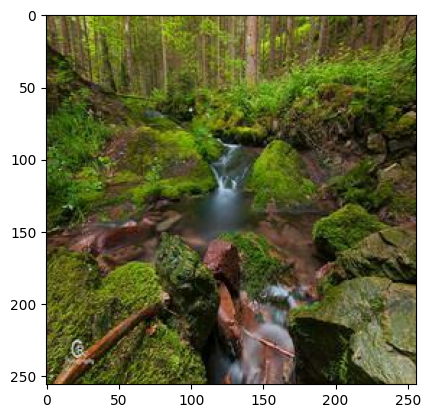

In [12]:
for x in photo_ds.take(1):
    print(x.shape, x.numpy().min(), x.numpy().max())

for x in photo_ds.take(1):
    print("min:", x.numpy().min(), "max:", x.numpy().max())
    plt.imshow((x[0] + 1) / 2)
    plt.show()

Epoch 1/200 - G: 11.1995, D_M: 0.6482, D_P: 0.6687, cycle: 6.4480, id: 3.0360, time: 307.3s


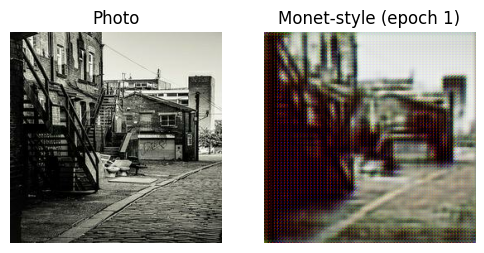

Epoch 2/200 - G: 10.3841, D_M: 0.6301, D_P: 0.6272, cycle: 5.8346, id: 2.7228, time: 292.9s
Epoch 3/200 - G: 10.1422, D_M: 0.6235, D_P: 0.6109, cycle: 5.6610, id: 2.6069, time: 293.0s
Epoch 4/200 - G: 9.6226, D_M: 0.6056, D_P: 0.5968, cycle: 5.2139, id: 2.4278, time: 295.2s
Epoch 5/200 - G: 10.7134, D_M: 0.3990, D_P: 0.5734, cycle: 5.4105, id: 2.5111, time: 293.9s


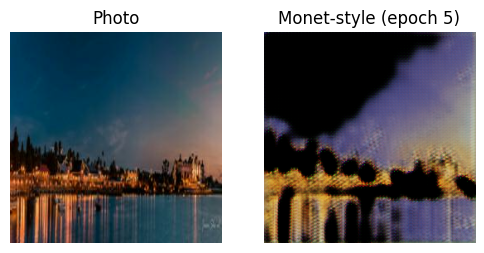

Epoch 6/200 - G: 10.5735, D_M: 0.3253, D_P: 0.5918, cycle: 5.1334, id: 2.3962, time: 295.9s
Epoch 7/200 - G: 11.1059, D_M: 0.3129, D_P: 0.5302, cycle: 5.2201, id: 2.4110, time: 296.5s
Epoch 8/200 - G: 11.1501, D_M: 0.2937, D_P: 0.4563, cycle: 5.0598, id: 2.3938, time: 300.5s
Epoch 9/200 - G: 11.1201, D_M: 0.2898, D_P: 0.4874, cycle: 4.9695, id: 2.3499, time: 295.2s
Epoch 10/200 - G: 11.0155, D_M: 0.3412, D_P: 0.4913, cycle: 4.8672, id: 2.3445, time: 296.5s


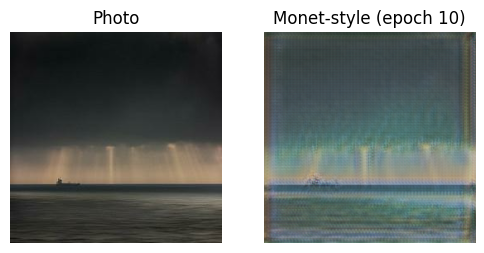

Epoch 11/200 - G: 10.9539, D_M: 0.3463, D_P: 0.4511, cycle: 4.9337, id: 2.3262, time: 297.5s
Epoch 12/200 - G: 10.9015, D_M: 0.3485, D_P: 0.4618, cycle: 4.7935, id: 2.2771, time: 298.0s
Epoch 13/200 - G: 10.8646, D_M: 0.3265, D_P: 0.4411, cycle: 4.7097, id: 2.2675, time: 297.6s
Epoch 14/200 - G: 10.9059, D_M: 0.3176, D_P: 0.4627, cycle: 4.6531, id: 2.2135, time: 299.0s
Epoch 15/200 - G: 10.6841, D_M: 0.3301, D_P: 0.4107, cycle: 4.5686, id: 2.2142, time: 299.0s


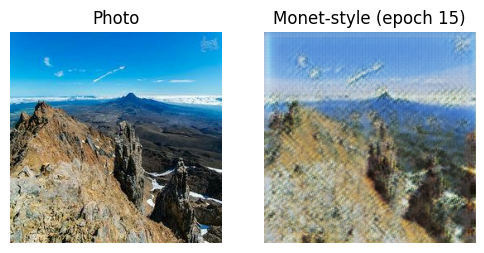

Epoch 16/200 - G: 11.2062, D_M: 0.3058, D_P: 0.3940, cycle: 4.6034, id: 2.2175, time: 298.8s
Epoch 17/200 - G: 11.1837, D_M: 0.2741, D_P: 0.4728, cycle: 4.6637, id: 2.2618, time: 298.8s
Epoch 18/200 - G: 11.1404, D_M: 0.2707, D_P: 0.4304, cycle: 4.5022, id: 2.1827, time: 299.2s
Epoch 19/200 - G: 11.5679, D_M: 0.2214, D_P: 0.4303, cycle: 4.5184, id: 2.2104, time: 298.4s
Epoch 20/200 - G: 11.7102, D_M: 0.2237, D_P: 0.4416, cycle: 4.4976, id: 2.2059, time: 301.7s


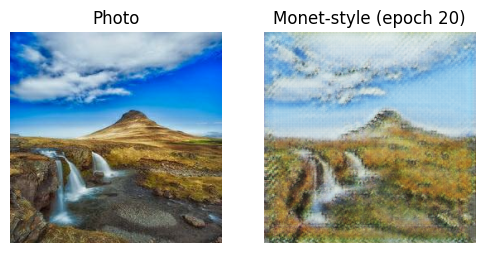

Epoch 21/200 - G: 11.2808, D_M: 0.2706, D_P: 0.4847, cycle: 4.4945, id: 2.1581, time: 306.5s
Epoch 22/200 - G: 11.1986, D_M: 0.2390, D_P: 0.4312, cycle: 4.4789, id: 2.1461, time: 304.8s
Epoch 23/200 - G: 11.6190, D_M: 0.2400, D_P: 0.4156, cycle: 4.4421, id: 2.1686, time: 307.4s
Epoch 24/200 - G: 11.4755, D_M: 0.2712, D_P: 0.3943, cycle: 4.4810, id: 2.1880, time: 339.0s
Epoch 25/200 - G: 11.3722, D_M: 0.2439, D_P: 0.3962, cycle: 4.4595, id: 2.1631, time: 304.6s


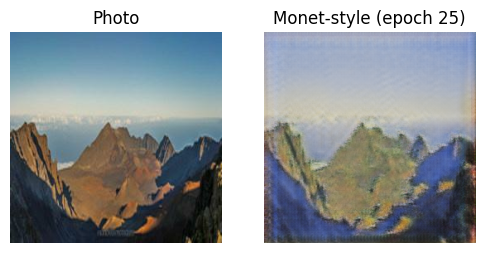

Epoch 26/200 - G: 11.3777, D_M: 0.2495, D_P: 0.4355, cycle: 4.3811, id: 2.1035, time: 295.1s
Epoch 27/200 - G: 11.6892, D_M: 0.2414, D_P: 0.3961, cycle: 4.4169, id: 2.1751, time: 295.0s
Epoch 28/200 - G: 11.2277, D_M: 0.2955, D_P: 0.3898, cycle: 4.2844, id: 2.0929, time: 300.7s
Epoch 29/200 - G: 11.0980, D_M: 0.3094, D_P: 0.4122, cycle: 4.2820, id: 2.0947, time: 312.9s
Epoch 30/200 - G: 11.2097, D_M: 0.2952, D_P: 0.3753, cycle: 4.2859, id: 2.0695, time: 326.3s


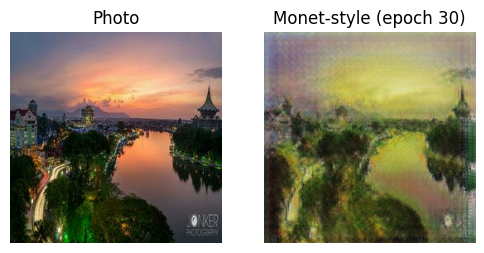

Epoch 31/200 - G: 11.2213, D_M: 0.2948, D_P: 0.3886, cycle: 4.3475, id: 2.1269, time: 319.2s
Epoch 32/200 - G: 11.0339, D_M: 0.2744, D_P: 0.3947, cycle: 4.2120, id: 2.1015, time: 310.9s
Epoch 33/200 - G: 11.1926, D_M: 0.2766, D_P: 0.4076, cycle: 4.2265, id: 2.0905, time: 296.5s
Epoch 34/200 - G: 10.8068, D_M: 0.3275, D_P: 0.3969, cycle: 4.1508, id: 2.0379, time: 297.8s
Epoch 35/200 - G: 10.9290, D_M: 0.2930, D_P: 0.4242, cycle: 4.2063, id: 2.0505, time: 294.3s


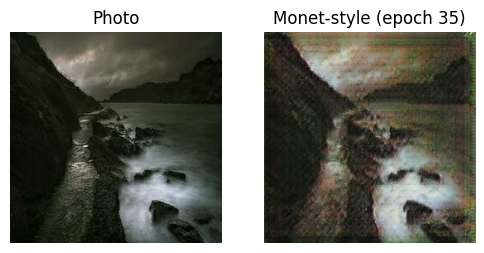

Epoch 36/200 - G: 10.6640, D_M: 0.3075, D_P: 0.4540, cycle: 4.1267, id: 2.0363, time: 297.5s
Epoch 37/200 - G: 10.5696, D_M: 0.2981, D_P: 0.4498, cycle: 4.1293, id: 1.9893, time: 296.2s
Epoch 38/200 - G: 10.4246, D_M: 0.2960, D_P: 0.4438, cycle: 4.0648, id: 1.9779, time: 295.7s
Epoch 39/200 - G: 10.6617, D_M: 0.3244, D_P: 0.4157, cycle: 4.1273, id: 2.0249, time: 294.3s
Epoch 40/200 - G: 10.3636, D_M: 0.2903, D_P: 0.4283, cycle: 4.0108, id: 1.9764, time: 297.9s


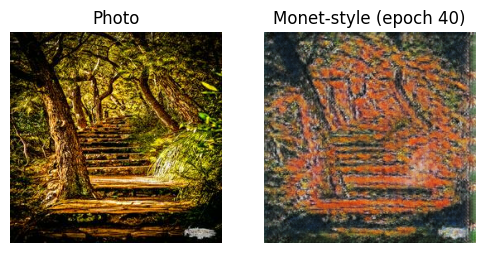

Epoch 41/200 - G: 10.7994, D_M: 0.2678, D_P: 0.4231, cycle: 4.0876, id: 2.0126, time: 304.9s
Epoch 42/200 - G: 10.4190, D_M: 0.2876, D_P: 0.4524, cycle: 4.0229, id: 1.9779, time: 299.0s
Epoch 43/200 - G: 10.8327, D_M: 0.2925, D_P: 0.4177, cycle: 4.1923, id: 2.0476, time: 297.2s
Epoch 44/200 - G: 10.4403, D_M: 0.3363, D_P: 0.4310, cycle: 4.0337, id: 1.9842, time: 302.6s
Epoch 45/200 - G: 10.4260, D_M: 0.2877, D_P: 0.4227, cycle: 4.1047, id: 1.9910, time: 307.2s


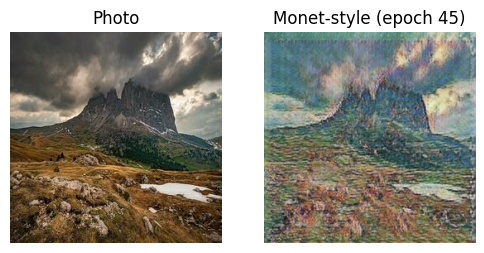

Epoch 46/200 - G: 10.6212, D_M: 0.2985, D_P: 0.4306, cycle: 4.1287, id: 2.0410, time: 306.5s
Epoch 47/200 - G: 10.4227, D_M: 0.2872, D_P: 0.4235, cycle: 3.8782, id: 1.8964, time: 301.2s
Epoch 48/200 - G: 10.1894, D_M: 0.2596, D_P: 0.4644, cycle: 3.8367, id: 1.8929, time: 305.4s
Epoch 49/200 - G: 10.6218, D_M: 0.2694, D_P: 0.4548, cycle: 4.0788, id: 2.0087, time: 300.2s
Epoch 50/200 - G: 10.7538, D_M: 0.2540, D_P: 0.4271, cycle: 4.1215, id: 2.0224, time: 300.9s


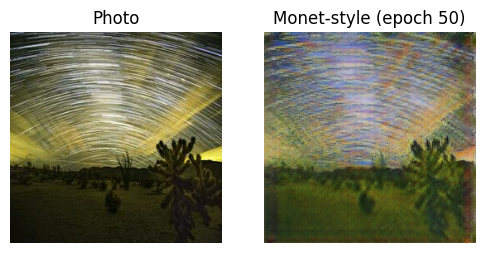

Epoch 51/200 - G: 10.6337, D_M: 0.2859, D_P: 0.4214, cycle: 4.0716, id: 2.0128, time: 302.8s
Epoch 52/200 - G: 10.6127, D_M: 0.2417, D_P: 0.4292, cycle: 4.0043, id: 1.9714, time: 297.3s
Epoch 53/200 - G: 10.5424, D_M: 0.2821, D_P: 0.4690, cycle: 4.0365, id: 1.9677, time: 298.1s
Epoch 54/200 - G: 10.1379, D_M: 0.2650, D_P: 0.4461, cycle: 3.8128, id: 1.8757, time: 300.6s
Epoch 55/200 - G: 10.3985, D_M: 0.2929, D_P: 0.4419, cycle: 3.9095, id: 1.9556, time: 299.4s


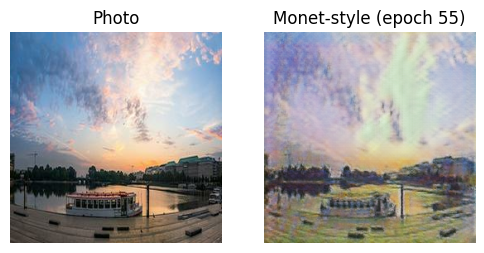

Epoch 56/200 - G: 10.3149, D_M: 0.2390, D_P: 0.4202, cycle: 3.9247, id: 1.9624, time: 294.8s
Epoch 57/200 - G: 10.5178, D_M: 0.2656, D_P: 0.4451, cycle: 3.9553, id: 1.9572, time: 294.3s
Epoch 58/200 - G: 10.4474, D_M: 0.2831, D_P: 0.4281, cycle: 3.8580, id: 1.8970, time: 294.1s
Epoch 59/200 - G: 10.3385, D_M: 0.2579, D_P: 0.4309, cycle: 3.8513, id: 1.9129, time: 293.9s
Epoch 60/200 - G: 10.2997, D_M: 0.2446, D_P: 0.4063, cycle: 3.8339, id: 1.8984, time: 293.9s


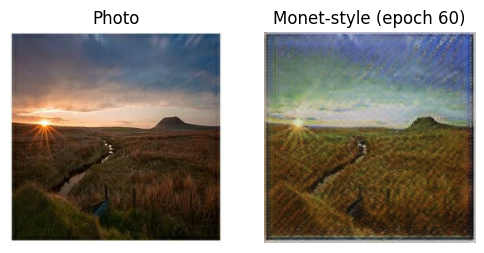

Epoch 61/200 - G: 10.6877, D_M: 0.2233, D_P: 0.4317, cycle: 3.9089, id: 1.9485, time: 300.1s
Epoch 62/200 - G: 10.4995, D_M: 0.2808, D_P: 0.4064, cycle: 3.9578, id: 1.9499, time: 296.4s
Epoch 63/200 - G: 10.7584, D_M: 0.2427, D_P: 0.3962, cycle: 3.9289, id: 1.9561, time: 297.6s
Epoch 64/200 - G: 10.7372, D_M: 0.2123, D_P: 0.3649, cycle: 3.8721, id: 1.9264, time: 297.4s
Epoch 65/200 - G: 10.8153, D_M: 0.2265, D_P: 0.4078, cycle: 3.8126, id: 1.8973, time: 296.1s


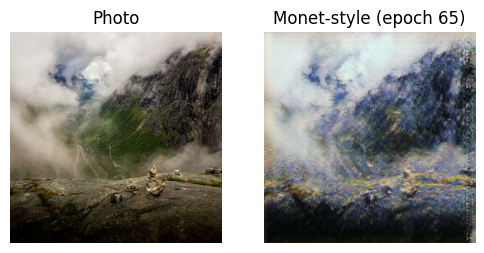

Epoch 66/200 - G: 10.6422, D_M: 0.2475, D_P: 0.4215, cycle: 3.9206, id: 1.9401, time: 298.9s
Epoch 67/200 - G: 10.4743, D_M: 0.2176, D_P: 0.3912, cycle: 3.7403, id: 1.8416, time: 303.6s
Epoch 68/200 - G: 10.5907, D_M: 0.2349, D_P: 0.4057, cycle: 3.7837, id: 1.9090, time: 296.7s
Epoch 69/200 - G: 10.3862, D_M: 0.2233, D_P: 0.3747, cycle: 3.6759, id: 1.8355, time: 298.0s
Epoch 70/200 - G: 10.9203, D_M: 0.2538, D_P: 0.3967, cycle: 3.8686, id: 1.9900, time: 296.2s


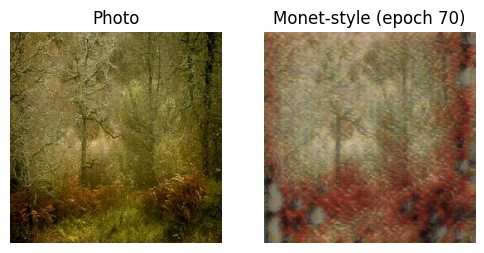

Epoch 71/200 - G: 11.2056, D_M: 0.2056, D_P: 0.3619, cycle: 3.8905, id: 1.9469, time: 299.5s
Epoch 72/200 - G: 10.4549, D_M: 0.2268, D_P: 0.3876, cycle: 3.6932, id: 1.8713, time: 297.5s
Epoch 73/200 - G: 10.7084, D_M: 0.1960, D_P: 0.3877, cycle: 3.6911, id: 1.8800, time: 299.0s
Epoch 74/200 - G: 10.9076, D_M: 0.2114, D_P: 0.3909, cycle: 3.7686, id: 1.8735, time: 308.7s
Epoch 75/200 - G: 10.5699, D_M: 0.2354, D_P: 0.4071, cycle: 3.6955, id: 1.8545, time: 299.4s


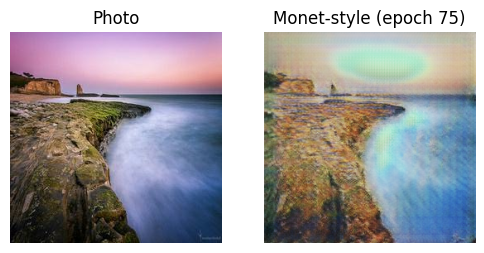

Epoch 76/200 - G: 10.7665, D_M: 0.2140, D_P: 0.4033, cycle: 3.7099, id: 1.8646, time: 304.3s
Epoch 77/200 - G: 11.0714, D_M: 0.2284, D_P: 0.3388, cycle: 3.8639, id: 1.9498, time: 299.8s
Epoch 78/200 - G: 10.7878, D_M: 0.1927, D_P: 0.3777, cycle: 3.6741, id: 1.8550, time: 303.5s
Epoch 79/200 - G: 10.6915, D_M: 0.2176, D_P: 0.4231, cycle: 3.6775, id: 1.8728, time: 297.6s
Epoch 80/200 - G: 10.5901, D_M: 0.2310, D_P: 0.3767, cycle: 3.6848, id: 1.8849, time: 296.4s


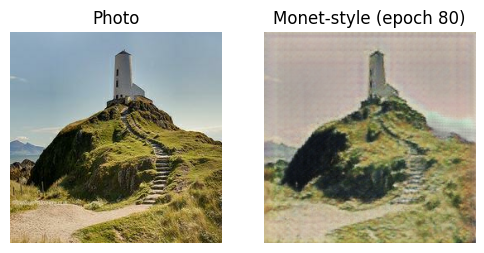

Epoch 81/200 - G: 10.9343, D_M: 0.1886, D_P: 0.3768, cycle: 3.7523, id: 1.8750, time: 297.4s
Epoch 82/200 - G: 10.8715, D_M: 0.1855, D_P: 0.3717, cycle: 3.7234, id: 1.8881, time: 297.6s
Epoch 83/200 - G: 10.9070, D_M: 0.2385, D_P: 0.3817, cycle: 3.7117, id: 1.9301, time: 297.2s
Epoch 84/200 - G: 10.8853, D_M: 0.1708, D_P: 0.4212, cycle: 3.6667, id: 1.8820, time: 298.1s
Epoch 85/200 - G: 10.9532, D_M: 0.1876, D_P: 0.3794, cycle: 3.6421, id: 1.8534, time: 300.4s


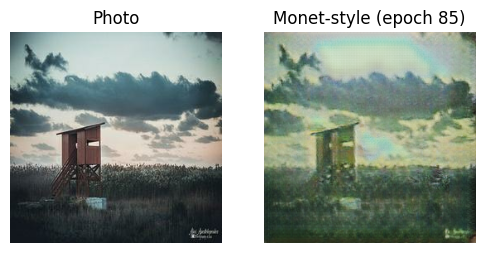

Epoch 86/200 - G: 11.0044, D_M: 0.1818, D_P: 0.3877, cycle: 3.6701, id: 1.8759, time: 299.4s
Epoch 87/200 - G: 10.8408, D_M: 0.2048, D_P: 0.3611, cycle: 3.5769, id: 1.8587, time: 295.7s
Epoch 88/200 - G: 11.2734, D_M: 0.2030, D_P: 0.3861, cycle: 3.8696, id: 1.9342, time: 295.3s
Epoch 89/200 - G: 10.5591, D_M: 0.1735, D_P: 0.3957, cycle: 3.5339, id: 1.8104, time: 295.3s
Epoch 90/200 - G: 10.8784, D_M: 0.1569, D_P: 0.3857, cycle: 3.6569, id: 1.8345, time: 297.0s


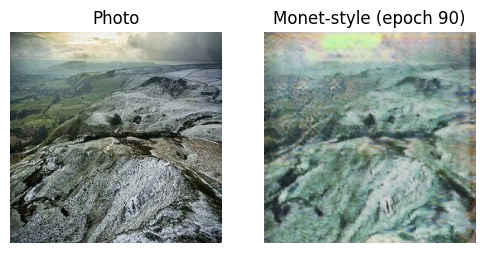

Epoch 91/200 - G: 11.2880, D_M: 0.1788, D_P: 0.3758, cycle: 3.6790, id: 1.8508, time: 295.2s
Epoch 92/200 - G: 11.1855, D_M: 0.1387, D_P: 0.3659, cycle: 3.5613, id: 1.8451, time: 294.0s
Epoch 93/200 - G: 10.8205, D_M: 0.1943, D_P: 0.3867, cycle: 3.5217, id: 1.8127, time: 294.4s
Epoch 94/200 - G: 11.0364, D_M: 0.1738, D_P: 0.3818, cycle: 3.5549, id: 1.7886, time: 294.4s
Epoch 95/200 - G: 11.2114, D_M: 0.1672, D_P: 0.3844, cycle: 3.7472, id: 1.8887, time: 294.4s


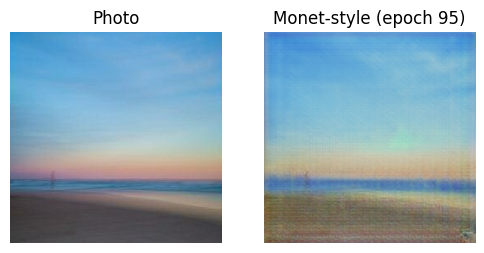

Epoch 96/200 - G: 11.0992, D_M: 0.2133, D_P: 0.4052, cycle: 3.5454, id: 1.8399, time: 295.0s
Epoch 97/200 - G: 10.7201, D_M: 0.1602, D_P: 0.4047, cycle: 3.4846, id: 1.7927, time: 296.8s
Epoch 98/200 - G: 11.1207, D_M: 0.1464, D_P: 0.3769, cycle: 3.5411, id: 1.7836, time: 299.2s
Epoch 99/200 - G: 11.4868, D_M: 0.1383, D_P: 0.3698, cycle: 3.6316, id: 1.8248, time: 297.5s
Epoch 100/200 - G: 11.4613, D_M: 0.2321, D_P: 0.3778, cycle: 3.7085, id: 1.9020, time: 298.0s


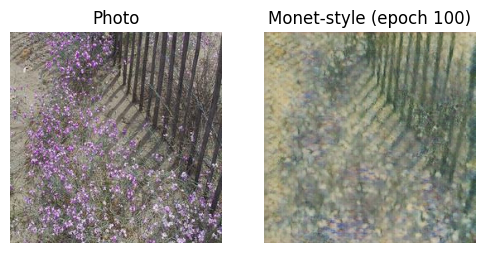

Epoch 101/200 - G: 11.1747, D_M: 0.1459, D_P: 0.3923, cycle: 3.5060, id: 1.7892, time: 301.2s
Epoch 102/200 - G: 10.9781, D_M: 0.1654, D_P: 0.3799, cycle: 3.4519, id: 1.8075, time: 298.0s
Epoch 103/200 - G: 10.8936, D_M: 0.2062, D_P: 0.3786, cycle: 3.4204, id: 1.7457, time: 297.4s
Epoch 104/200 - G: 10.6667, D_M: 0.1873, D_P: 0.3868, cycle: 3.4214, id: 1.7866, time: 298.3s
Epoch 105/200 - G: 10.8684, D_M: 0.2066, D_P: 0.3645, cycle: 3.4533, id: 1.7812, time: 298.9s


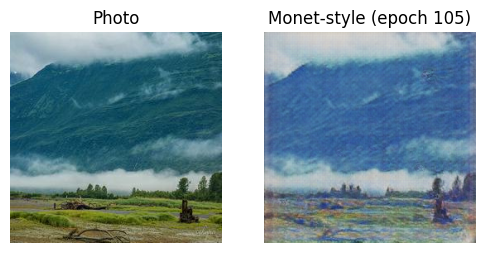

Epoch 106/200 - G: 11.0376, D_M: 0.1893, D_P: 0.3689, cycle: 3.5974, id: 1.8041, time: 296.4s
Epoch 107/200 - G: 10.6135, D_M: 0.2134, D_P: 0.4072, cycle: 3.4650, id: 1.8025, time: 296.9s
Epoch 108/200 - G: 10.5785, D_M: 0.2548, D_P: 0.3783, cycle: 3.4325, id: 1.7345, time: 297.5s
Epoch 109/200 - G: 10.6133, D_M: 0.2051, D_P: 0.4113, cycle: 3.4371, id: 1.7533, time: 296.8s
Epoch 110/200 - G: 11.6707, D_M: 0.2025, D_P: 0.3705, cycle: 3.8886, id: 1.8871, time: 296.4s


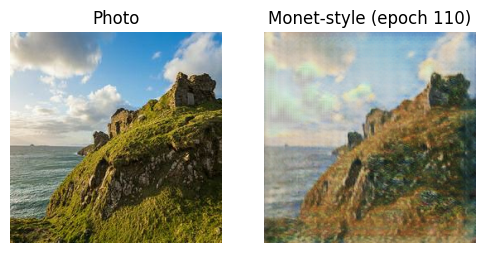

Epoch 111/200 - G: 10.7991, D_M: 0.2489, D_P: 0.4114, cycle: 3.5282, id: 1.7873, time: 297.0s
Epoch 112/200 - G: 10.3092, D_M: 0.1772, D_P: 0.3950, cycle: 3.4089, id: 1.7513, time: 297.0s
Epoch 113/200 - G: 11.2205, D_M: 0.2399, D_P: 0.3680, cycle: 3.6965, id: 1.8556, time: 297.9s
Epoch 114/200 - G: 10.6432, D_M: 0.1872, D_P: 0.3754, cycle: 3.4564, id: 1.7506, time: 298.9s
Epoch 115/200 - G: 11.0137, D_M: 0.2043, D_P: 0.3963, cycle: 3.5557, id: 1.8194, time: 297.8s


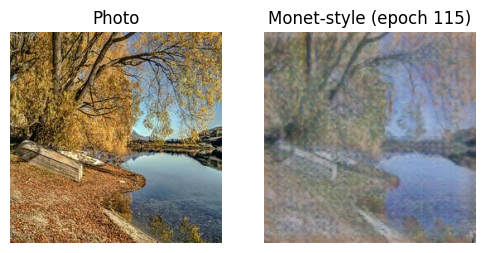

Epoch 116/200 - G: 10.7557, D_M: 0.2230, D_P: 0.3860, cycle: 3.5104, id: 1.7910, time: 295.7s
Epoch 117/200 - G: 11.1432, D_M: 0.1775, D_P: 0.3914, cycle: 3.5936, id: 1.8287, time: 296.0s
Epoch 118/200 - G: 10.6127, D_M: 0.2123, D_P: 0.3898, cycle: 3.4838, id: 1.7665, time: 295.5s
Epoch 119/200 - G: 10.8507, D_M: 0.2008, D_P: 0.3987, cycle: 3.5055, id: 1.7889, time: 295.4s
Epoch 120/200 - G: 10.7326, D_M: 0.1770, D_P: 0.3916, cycle: 3.4604, id: 1.7416, time: 295.4s


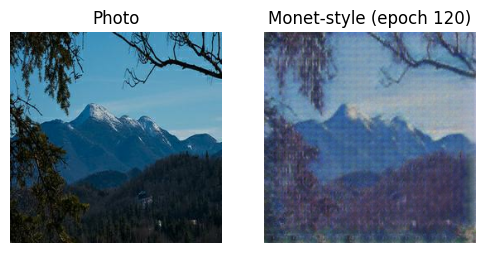

Epoch 121/200 - G: 10.5687, D_M: 0.2268, D_P: 0.3751, cycle: 3.4405, id: 1.7495, time: 296.2s
Epoch 122/200 - G: 10.8160, D_M: 0.1947, D_P: 0.3843, cycle: 3.5163, id: 1.7745, time: 296.0s
Epoch 123/200 - G: 10.8772, D_M: 0.1880, D_P: 0.3568, cycle: 3.4218, id: 1.7497, time: 296.1s
Epoch 124/200 - G: 10.8231, D_M: 0.2428, D_P: 0.3970, cycle: 3.5560, id: 1.8214, time: 295.5s
Epoch 125/200 - G: 10.3846, D_M: 0.1970, D_P: 0.3869, cycle: 3.4254, id: 1.7598, time: 294.3s


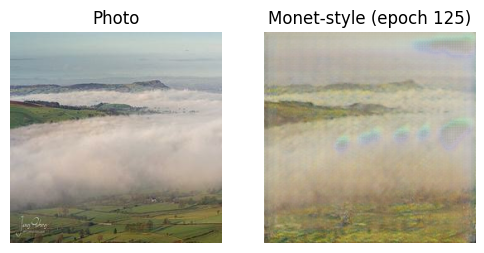

Epoch 126/200 - G: 10.6068, D_M: 0.1839, D_P: 0.4001, cycle: 3.4672, id: 1.7896, time: 295.2s
Epoch 127/200 - G: 10.7029, D_M: 0.1901, D_P: 0.4048, cycle: 3.4367, id: 1.7481, time: 295.7s
Epoch 128/200 - G: 10.5216, D_M: 0.1751, D_P: 0.3798, cycle: 3.3625, id: 1.7671, time: 295.1s
Epoch 129/200 - G: 10.7747, D_M: 0.1867, D_P: 0.4143, cycle: 3.4701, id: 1.7804, time: 295.7s
Epoch 130/200 - G: 10.8465, D_M: 0.1844, D_P: 0.3516, cycle: 3.4281, id: 1.7500, time: 296.5s


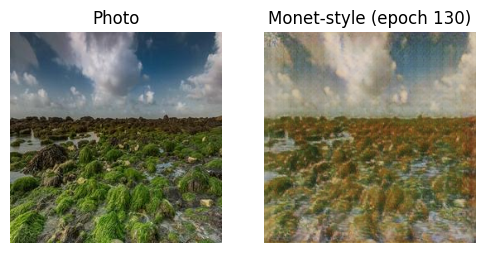

Epoch 131/200 - G: 11.0914, D_M: 0.2367, D_P: 0.3728, cycle: 3.4690, id: 1.7695, time: 297.1s
Epoch 132/200 - G: 10.7723, D_M: 0.1942, D_P: 0.3640, cycle: 3.4052, id: 1.7680, time: 296.9s
Epoch 133/200 - G: 11.1348, D_M: 0.1952, D_P: 0.3468, cycle: 3.4692, id: 1.7671, time: 296.2s
Epoch 134/200 - G: 11.1018, D_M: 0.1536, D_P: 0.3859, cycle: 3.4743, id: 1.7835, time: 296.0s
Epoch 135/200 - G: 11.2091, D_M: 0.2275, D_P: 0.3757, cycle: 3.5654, id: 1.8176, time: 296.7s


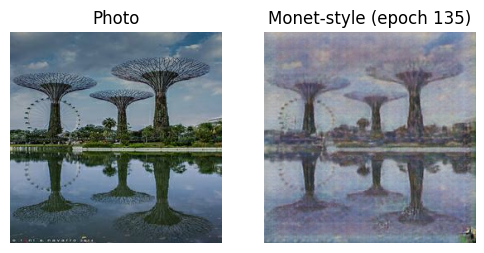

Epoch 136/200 - G: 10.9633, D_M: 0.2363, D_P: 0.3546, cycle: 3.4838, id: 1.7811, time: 297.2s
Epoch 137/200 - G: 10.8048, D_M: 0.1876, D_P: 0.3492, cycle: 3.4120, id: 1.7355, time: 296.5s
Epoch 138/200 - G: 11.2322, D_M: 0.1553, D_P: 0.3611, cycle: 3.5364, id: 1.7810, time: 296.3s
Epoch 139/200 - G: 10.9597, D_M: 0.1686, D_P: 0.3282, cycle: 3.3828, id: 1.6997, time: 297.0s
Epoch 140/200 - G: 10.8486, D_M: 0.2166, D_P: 0.3780, cycle: 3.3824, id: 1.7110, time: 297.0s


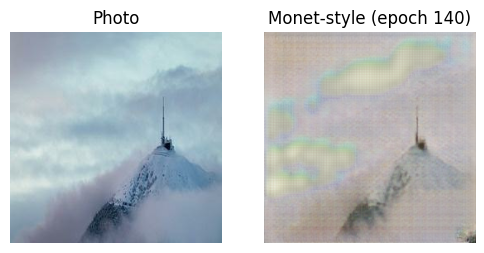

Epoch 141/200 - G: 10.6781, D_M: 0.1871, D_P: 0.3735, cycle: 3.3625, id: 1.7235, time: 298.0s
Epoch 142/200 - G: 10.4872, D_M: 0.1934, D_P: 0.3744, cycle: 3.2926, id: 1.7195, time: 297.8s
Epoch 143/200 - G: 10.9754, D_M: 0.1453, D_P: 0.3401, cycle: 3.4165, id: 1.7465, time: 298.2s
Epoch 144/200 - G: 11.2864, D_M: 0.1841, D_P: 0.3611, cycle: 3.6887, id: 1.8495, time: 298.7s
Epoch 145/200 - G: 11.0203, D_M: 0.1988, D_P: 0.3839, cycle: 3.5053, id: 1.7651, time: 298.4s


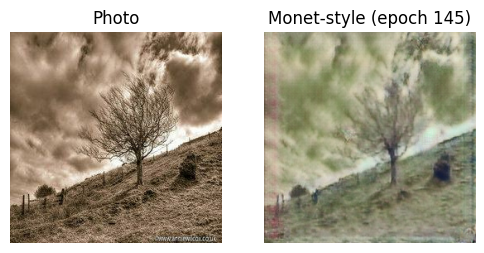

Epoch 146/200 - G: 10.6134, D_M: 0.1949, D_P: 0.3772, cycle: 3.2665, id: 1.6566, time: 300.5s
Epoch 147/200 - G: 10.5952, D_M: 0.1791, D_P: 0.3912, cycle: 3.2791, id: 1.6779, time: 300.1s
Epoch 148/200 - G: 10.8332, D_M: 0.1705, D_P: 0.3650, cycle: 3.3257, id: 1.7259, time: 297.1s
Epoch 149/200 - G: 10.9281, D_M: 0.1815, D_P: 0.3746, cycle: 3.4552, id: 1.7613, time: 296.1s
Epoch 150/200 - G: 11.2271, D_M: 0.1988, D_P: 0.3456, cycle: 3.4306, id: 1.7575, time: 297.6s


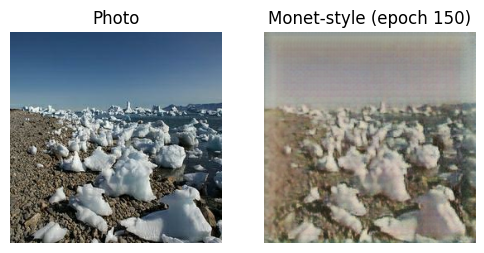

Epoch 151/200 - G: 11.0792, D_M: 0.1918, D_P: 0.3769, cycle: 3.4339, id: 1.7826, time: 296.8s
Epoch 152/200 - G: 11.0815, D_M: 0.1482, D_P: 0.3688, cycle: 3.3261, id: 1.7180, time: 296.4s
Epoch 153/200 - G: 11.0598, D_M: 0.1283, D_P: 0.4081, cycle: 3.3068, id: 1.7143, time: 296.5s
Epoch 154/200 - G: 10.6936, D_M: 0.1319, D_P: 0.4117, cycle: 3.2497, id: 1.6795, time: 296.6s
Epoch 155/200 - G: 10.7852, D_M: 0.1712, D_P: 0.3668, cycle: 3.2650, id: 1.7523, time: 296.2s


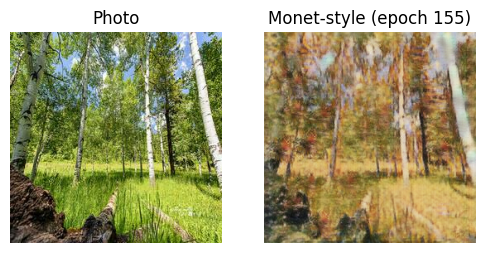

Epoch 156/200 - G: 11.3796, D_M: 0.1530, D_P: 0.3929, cycle: 3.3562, id: 1.7403, time: 296.0s
Epoch 157/200 - G: 10.9576, D_M: 0.1259, D_P: 0.3960, cycle: 3.2838, id: 1.7339, time: 296.6s
Epoch 158/200 - G: 11.1827, D_M: 0.1960, D_P: 0.3618, cycle: 3.2819, id: 1.7072, time: 295.8s
Epoch 159/200 - G: 11.2996, D_M: 0.1906, D_P: 0.3595, cycle: 3.3797, id: 1.7866, time: 297.4s
Epoch 160/200 - G: 10.6250, D_M: 0.1423, D_P: 0.4106, cycle: 3.2092, id: 1.6586, time: 295.9s


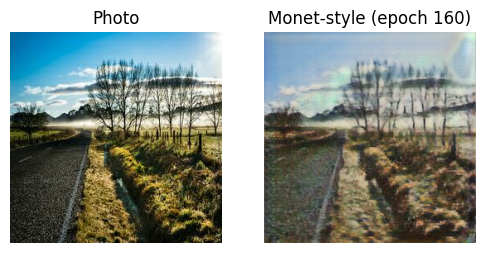

Epoch 161/200 - G: 11.4182, D_M: 0.1628, D_P: 0.3439, cycle: 3.3602, id: 1.7249, time: 294.9s
Epoch 162/200 - G: 10.9063, D_M: 0.1314, D_P: 0.3443, cycle: 3.3114, id: 1.6485, time: 296.3s
Epoch 163/200 - G: 11.1966, D_M: 0.1898, D_P: 0.3661, cycle: 3.2861, id: 1.7748, time: 297.1s
Epoch 164/200 - G: 11.3446, D_M: 0.1369, D_P: 0.3754, cycle: 3.3507, id: 1.7548, time: 295.8s
Epoch 165/200 - G: 10.8497, D_M: 0.1827, D_P: 0.3762, cycle: 3.2601, id: 1.6703, time: 295.4s


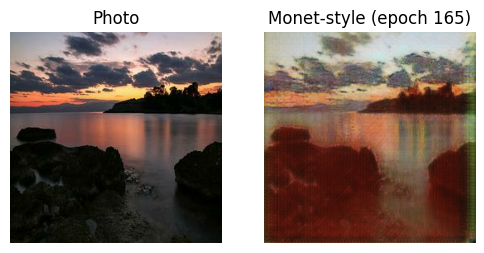

Epoch 166/200 - G: 10.9983, D_M: 0.1841, D_P: 0.3956, cycle: 3.3097, id: 1.6778, time: 295.1s
Epoch 167/200 - G: 10.6139, D_M: 0.1597, D_P: 0.3894, cycle: 3.1736, id: 1.6420, time: 296.4s
Epoch 168/200 - G: 11.0100, D_M: 0.1485, D_P: 0.3799, cycle: 3.2533, id: 1.6934, time: 296.5s
Epoch 169/200 - G: 10.8583, D_M: 0.1379, D_P: 0.3838, cycle: 3.2323, id: 1.6230, time: 297.0s
Epoch 170/200 - G: 11.1737, D_M: 0.1626, D_P: 0.3846, cycle: 3.2890, id: 1.7329, time: 297.0s


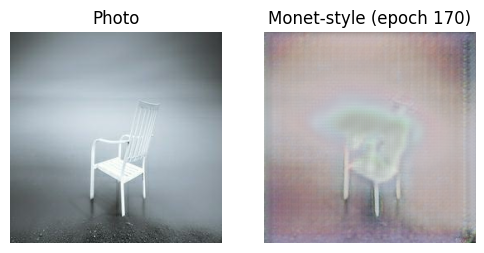

Epoch 171/200 - G: 11.1540, D_M: 0.2002, D_P: 0.3936, cycle: 3.3255, id: 1.6753, time: 296.2s
Epoch 172/200 - G: 10.8709, D_M: 0.1482, D_P: 0.3848, cycle: 3.3027, id: 1.6995, time: 296.7s
Epoch 173/200 - G: 10.8995, D_M: 0.1259, D_P: 0.3866, cycle: 3.2384, id: 1.7126, time: 299.7s
Epoch 174/200 - G: 11.0548, D_M: 0.1473, D_P: 0.3865, cycle: 3.1903, id: 1.6514, time: 306.5s
Epoch 175/200 - G: 10.7447, D_M: 0.1741, D_P: 0.3939, cycle: 3.2115, id: 1.6532, time: 306.4s


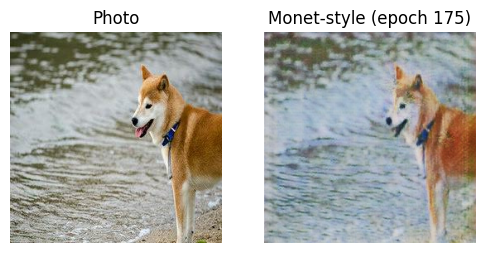

Epoch 176/200 - G: 11.0425, D_M: 0.1871, D_P: 0.4424, cycle: 3.2454, id: 1.6354, time: 303.4s
Epoch 177/200 - G: 10.6590, D_M: 0.1501, D_P: 0.4455, cycle: 3.2117, id: 1.6041, time: 297.5s
Epoch 178/200 - G: 10.6537, D_M: 0.1537, D_P: 0.4186, cycle: 3.1793, id: 1.5928, time: 298.5s
Epoch 179/200 - G: 11.1295, D_M: 0.1278, D_P: 0.4198, cycle: 3.2032, id: 1.6380, time: 298.2s
Epoch 180/200 - G: 11.3084, D_M: 0.2089, D_P: 0.4139, cycle: 3.3174, id: 1.6795, time: 296.3s


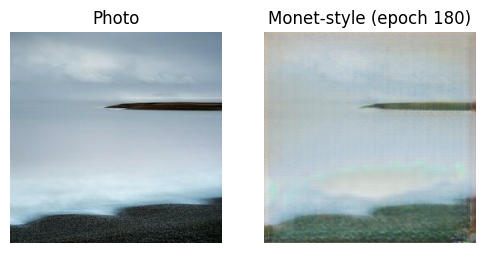

Epoch 181/200 - G: 11.0143, D_M: 0.1736, D_P: 0.3996, cycle: 3.3142, id: 1.6397, time: 295.5s
Epoch 182/200 - G: 10.8080, D_M: 0.1411, D_P: 0.4552, cycle: 3.3232, id: 1.6414, time: 295.1s
Epoch 183/200 - G: 11.2744, D_M: 0.1489, D_P: 0.4085, cycle: 3.4308, id: 1.7206, time: 294.4s
Epoch 184/200 - G: 10.9872, D_M: 0.1496, D_P: 0.4271, cycle: 3.2647, id: 1.6297, time: 295.4s
Epoch 185/200 - G: 11.0473, D_M: 0.1237, D_P: 0.4304, cycle: 3.3477, id: 1.6375, time: 294.0s


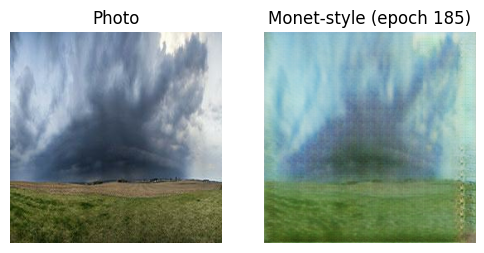

Epoch 186/200 - G: 11.4287, D_M: 0.1303, D_P: 0.4135, cycle: 3.3135, id: 1.6578, time: 294.3s
Epoch 187/200 - G: 11.3922, D_M: 0.1307, D_P: 0.4340, cycle: 3.2525, id: 1.6461, time: 294.5s
Epoch 188/200 - G: 11.8273, D_M: 0.1736, D_P: 0.4227, cycle: 3.2870, id: 1.7195, time: 294.5s
Epoch 189/200 - G: 10.4823, D_M: 0.1413, D_P: 0.4211, cycle: 3.2305, id: 1.6372, time: 294.2s
Epoch 190/200 - G: 11.5230, D_M: 0.1557, D_P: 0.3969, cycle: 3.4307, id: 1.7033, time: 301.3s


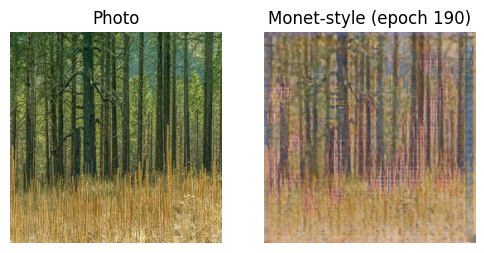

Epoch 191/200 - G: 11.1903, D_M: 0.1548, D_P: 0.4070, cycle: 3.3692, id: 1.7010, time: 305.1s
Epoch 192/200 - G: 10.6029, D_M: 0.1173, D_P: 0.4320, cycle: 3.1627, id: 1.6081, time: 303.6s
Epoch 193/200 - G: 11.1318, D_M: 0.1114, D_P: 0.4648, cycle: 3.2498, id: 1.6673, time: 295.6s
Epoch 194/200 - G: 11.0449, D_M: 0.2283, D_P: 0.4433, cycle: 3.2156, id: 1.6570, time: 295.3s
Epoch 195/200 - G: 10.5340, D_M: 0.1068, D_P: 0.4466, cycle: 3.1932, id: 1.5854, time: 294.5s


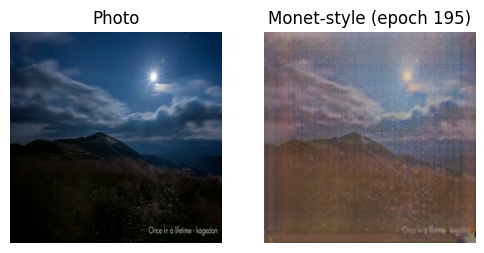

Epoch 196/200 - G: 11.3643, D_M: 0.1233, D_P: 0.4414, cycle: 3.4189, id: 1.6750, time: 295.5s
Epoch 197/200 - G: 10.7988, D_M: 0.1511, D_P: 0.4536, cycle: 3.2417, id: 1.6118, time: 295.5s
Epoch 198/200 - G: 10.5767, D_M: 0.1165, D_P: 0.4691, cycle: 3.1781, id: 1.5873, time: 296.2s
Epoch 199/200 - G: 10.5393, D_M: 0.1620, D_P: 0.4677, cycle: 3.1475, id: 1.5894, time: 296.4s
Epoch 200/200 - G: 10.8991, D_M: 0.1630, D_P: 0.4086, cycle: 3.2458, id: 1.6366, time: 296.1s


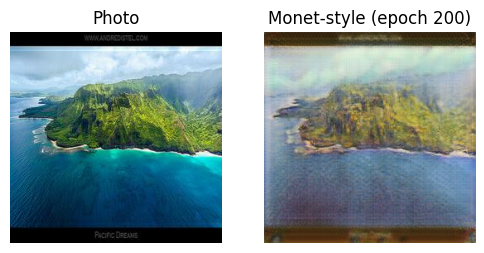

In [13]:
history = {"G_loss": [], "D_M": [], "D_P": [], "cycle": [], "id": []}

def sample_and_show(epoch):
    sample_photo = next(iter(photo_ds))
    fake_monet = G_M(sample_photo, training=False)
    fake_monet = (fake_monet[0] + 1.0) / 2.0
    real_photo = (sample_photo[0] + 1.0) / 2.0

    plt.figure(figsize=(6,3))
    plt.subplot(1,2,1)
    plt.imshow(real_photo.numpy())
    plt.title("Photo")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(fake_monet.numpy())
    plt.title(f"Monet-style (epoch {epoch})")
    plt.axis("off")
    plt.show()
def train():
  for epoch in range(1, epochs + 1):
      start = time.time()
      logs_epoch = {k: [] for k in history.keys()}

      for real_monet, real_photo in zip(monet_ds, photo_ds):
          logs = train_step(real_monet, real_photo)
          for k in history.keys():
              logs_epoch[k].append(logs[k].numpy())


      for k in history.keys():
          mean_val = float(np.mean(logs_epoch[k]))
          history[k].append(mean_val)

      print(f"Epoch {epoch}/{epochs} - "
            f"G: {history['G_loss'][-1]:.4f}, "
            f"D_M: {history['D_M'][-1]:.4f}, "
            f"D_P: {history['D_P'][-1]:.4f}, "
            f"cycle: {history['cycle'][-1]:.4f}, "
            f"id: {history['id'][-1]:.4f}, "
            f"time: {time.time()-start:.1f}s")

      if epoch % 5 == 0 or epoch == 1:
          sample_and_show(epoch)
train()

In [14]:
G_M.save("G_M_model")   
G_P.save("G_P_model")   
D_M.save("D_M_model")   
D_P.save("D_P_model")

INFO:tensorflow:Assets written to: G_M_model/assets


INFO:tensorflow:Assets written to: G_M_model/assets


INFO:tensorflow:Assets written to: G_P_model/assets


INFO:tensorflow:Assets written to: G_P_model/assets


INFO:tensorflow:Assets written to: D_M_model/assets


INFO:tensorflow:Assets written to: D_M_model/assets


INFO:tensorflow:Assets written to: D_P_model/assets


INFO:tensorflow:Assets written to: D_P_model/assets


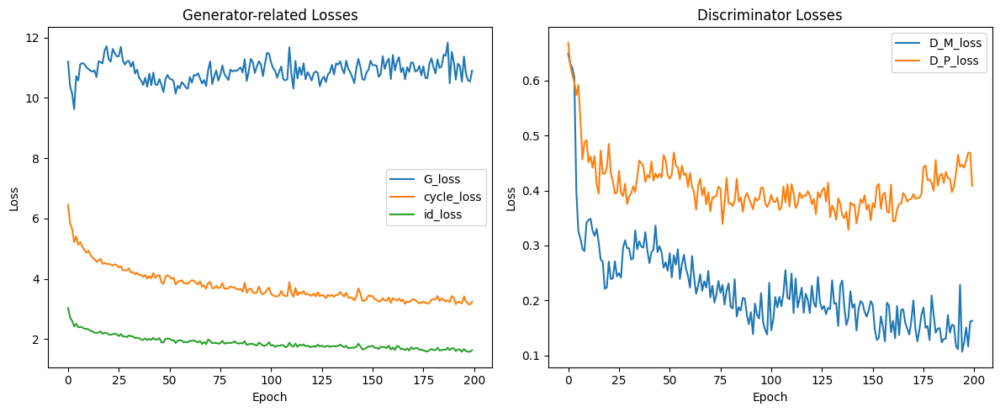

In [15]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.plot(history["G_loss"], label="G_loss")
plt.plot(history["cycle"], label="cycle_loss")
plt.plot(history["id"], label="id_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Generator-related Losses")
plt.legend()

plt.subplot(1,2,2)
plt.plot(history["D_M"], label="D_M_loss")
plt.plot(history["D_P"], label="D_P_loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Discriminator Losses")
plt.legend()

plt.tight_layout()
plt.show()

<h3> Analysis of CycleGAN Training Losses</h3>


<h5> 2. Generator-Related Losses (Left Plot)</h5>

This plot tracks the three components that define the Generator's total objective function, $G_{loss}$.

* **Cycle Consistency Loss (`cycle\_loss`, Orange):**
    * **Trend:** Starts high (around 6.0) and exhibits a sharp, clear decrease, stabilizing below **4.0** by epoch 100.
    * **Interpretation:** This is the most crucial indicator of content preservation. The rapid decline shows the model quickly learned the content-preserving mapping ($X \to Y \to X$ and $Y \to X \to Y$), ensuring the generated images retain the structure and semantic meaning of the original photographs. Its low, stable value confirms the architecture's success in enforcing cycle consistency.
* **Identity Loss (`id\_loss`, Green):**
    * **Trend:** Starts lower (around 3.0) and decreases steadily, stabilizing below **2.0**.
    * **Interpretation:** This loss ensures that if the generator is fed an image from its target domain (e.g., a real Monet painting into $G_{\text{photo}\to\text{monet}}$), the output is minimally changed. The low value suggests the model successfully avoids unnecessarily shifting the color or style of images already in the target domain, promoting stable style application.
* **Total Generator Loss (`G\_loss`, Blue):**
    * **Trend:** Highly volatile but remains high and stable, fluctuating mostly between **10.5 and 11.5**.
    * **Interpretation:** This loss includes the adversarial component, which dominates the total magnitude. The relative stability indicates that the Generator and Discriminator are in a state of continuous, active competition (an equilibrium). Neither network is overwhelmingly winning, which is ideal for GAN training.


<h5> 3. Discriminator Losses (Right Plot)</h5>

The Discriminator losses track how well the critics are performing at classifying real images from generated ones.

* **Monet Discriminator Loss (`D\_M\_loss`, Blue):**
    * **Trend:** Shows a clear downward trend, stabilizing at a low value (around **0.15 to 0.20**), particularly after epoch 100.
    * **Interpretation:** The Discriminator for the Monet domain is effective and continually improving at distinguishing between the real Monet paintings and the fake ones created by the Generator. This continuous pressure forces the Generator to produce higher-quality, more convincing Monet-style images.
* **Photo Discriminator Loss (`D\_P\_loss`, Orange):**
    * **Trend:** Shows initial decrease but quickly levels off, remaining relatively flat and higher than `D_M_loss` (fluctuating around **0.35 to 0.45**).
    * **Interpretation:** This discriminator is judging the Monet $\to$ Photo mapping. The higher, less volatile loss suggests that the Generator is finding this translation (turning a Monet painting back into a realistic photo) slightly easier to fool the discriminator, or that the discriminator is simply less effective in this domain due to the stylistic differences. The stable curve confirms that this part of the mapping is also balanced.

<h5> Summary</h5>

The training shows strong convergence with no signs of divergence or mode collapse (where the generator starts producing only a few types of images). The critical structural losses (`cycle_loss` and `id_loss`) rapidly decreased and stabilized, demonstrating that the model quickly mastered the fundamental constraints of the problem. The adversarial losses show a consistent, stable equilibrium between the Generator and the Discriminators.


Note that, I couldn’t run my notebook on Kaggle because it kept getting stuck at **session starting**, so there is no leaderbroad score.

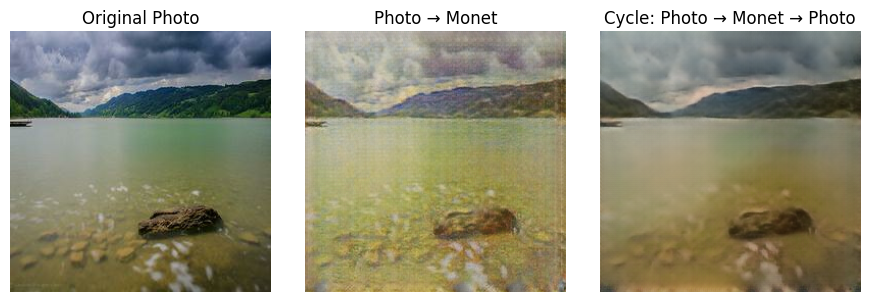

In [63]:
#evauate cycle image
def evauatecyclerandomimage():
    photo = load_and_preprocess(get_random_image(photo_dir))      
    photo_batch = tf.expand_dims(photo, 0)          

    
    monet = G_M(photo_batch, training=False)        

    
    recon_photo = G_P(monet, training=False)         

   
    photo_vis = (photo + 1.0) / 2.0                  
    monet_vis = (monet[0] + 1.0) / 2.0              
    recon_vis = (recon_photo[0] + 1.0) / 2.0        

    plt.figure(figsize=(9, 3))

    plt.subplot(1, 3, 1)
    plt.imshow(photo_vis.numpy())
    plt.title("Original Photo")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(monet_vis.numpy())
    plt.title("Photo → Monet")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(recon_vis.numpy())
    plt.title("Cycle: Photo → Monet → Photo")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

evauatecyclerandomimage()

<h5>Evaluate Cycle</h5>

- The model successfully performs style transfer (Photo → Monet). A Monet-like color palette emerges, though the results appear somewhat blurry.  
- It preserves the overall scene structure (mountains, water, rock).  
- The cycle-consistency loss is functioning: translating Monet → Photo recovers the original shapes, and the color tones roughly match the source.  

Cycle-consistency loss is still improving, which indicates the model has not yet fully converged. Since training has already run for over 24 hours, extending it further was not feasible.


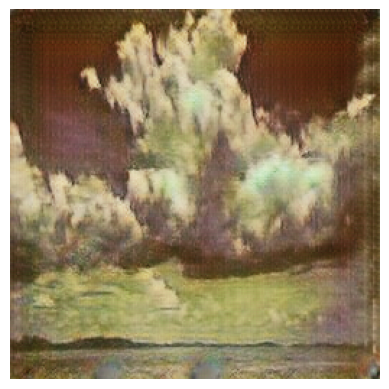

In [64]:
photo = load_and_preprocess(get_random_image(photo_dir))  
photo = tf.expand_dims(photo, 0)               
monet_style = G_M(photo, training=False)
monet_style = (monet_style + 1.0) / 2.0     

plt.imshow(monet_style[0].numpy())
plt.axis("off")
plt.show()

In [ ]:
def convert_folder(img_paths, output_dir, generator):

    os.makedirs(output_dir, exist_ok=True)
    print(f"Found {len(img_paths)} images.")

    for file in img_paths:
        #input_path = os.path.join(input_dir, filename)
        if not os.path.isfile(file):
            continue
        _, filename = os.path.split(file)
        output_path = os.path.join(output_dir, filename)
        #print(output_path)

        img = load_and_preprocess(file)
        img = tf.expand_dims(img, 0)


        monet_img = generator(img, training=False)
        monet_img = (monet_img[0] + 1.0) / 2.0  # to [0,1]


        monet_img = tf.image.convert_image_dtype(monet_img, dtype=tf.uint8)
        encoded = tf.image.encode_jpeg(monet_img)
        tf.io.write_file(output_path, encoded)

        print(f"Saved: {output_path}")

    print("Done!")
    print(f"Saved {len(img_paths)} images to {output_dir}")


convert_folder(img_paths,
               f"{path}/submit",
               G_M)

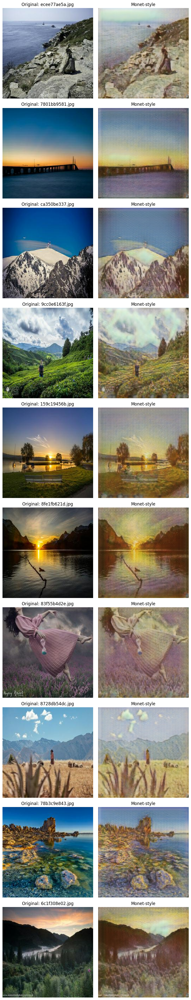

In [22]:
def show_random_comparisons(original_dir, converted_dir, n_samples=5):

    orig_files = set([
        f for f in os.listdir(original_dir)
        if f.lower().endswith((".jpg"))
    ])
    conv_files = set([
        f for f in os.listdir(converted_dir)
        if f.lower().endswith((".jpg"))
    ])


    common_files = sorted(list(orig_files & conv_files))
    if len(common_files) == 0:
        print("No common images found between the two folders.")
        return


    n_samples = min(n_samples, len(common_files))


    sampled = random.sample(common_files, n_samples)


    plt.figure(figsize=(8, 4 * n_samples))
    for i, fname in enumerate(sampled):
        orig_path = os.path.join(original_dir, fname)
        conv_path = os.path.join(converted_dir, fname)

        orig_img = Image.open(orig_path).convert("RGB")
        conv_img = Image.open(conv_path).convert("RGB")

        
        plt.subplot(n_samples, 2, 2*i + 1)
        plt.imshow(orig_img)
        plt.title(f"Original: {fname}")
        plt.axis("off")

    
        plt.subplot(n_samples, 2, 2*i + 2)
        plt.imshow(conv_img)
        plt.title("Monet-style")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


show_random_comparisons(photo_dir, f"{path}/submit", n_samples=10)

<h3>conclude </h3>
This model has successfully achieved photo-to-Monet style transfer while maintaining scene structure through cycle consistency. However, due to insufficient training and limited generator capacity, the generated images still exhibit noticeable blurriness and lack of detail. Overall, the results indicate that the model is learning in the right direction, but longer training or a stronger network architecture is required to achieve higher-quality style transfer.